In [1]:
import pandas as pd
import os
import ast
import numpy as np
import pickle
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns 

In [2]:
path = 'C:/Users/HEN1/Projects/YELP_DATASET/DATA'
file_names = ['yelp_academic_dataset_business.json', 
              'yelp_academic_dataset_checkin.json',
              'yelp_academic_dataset_review.json', 
              'yelp_academic_dataset_tip.json', 
              'yelp_academic_dataset_user.json', 
              'yelp_academic_dataset_review_notext.csv']
files = [os.path.join(path, f) for f in file_names]

## Business

In [3]:
df_business = pd.read_json(files[0], lines=True)

In [4]:

# Error in dataset
df_business.loc[129241,'state'] = 'BC'
df_business.loc[3905,'city'] = 'Burnaby'
df_business.loc[49416,'city'] = 'Burnaby'
df_business.loc[142343,'city'] = 'Burnaby'

In [5]:
# Get restaurants in business dataset
df_rest = df_business[df_business['categories'].str.contains('Restaurant.*')==True].reset_index()
df_rest = df_rest.drop(columns = 'index')

In [6]:
df_rest_name = df_rest[['business_id', 'name']]
df_rest_name

,business_id,name
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX
2,D4JtQNTI4X3KcbzacDJsMw,Bob Likes Thai Food
3,jFYIsSb7r1QeESVUnXPHBw,Boxwood Biscuit
4,HPA_qyMEddpAEtFof02ixg,Mr G's Pizza & Subs
...,...,...
50788,Zl6SUy6x9jqjRu2HbtEO6A,Split Dine and Drink
50789,Q78fYV6B6P6GmX07YVgi4g,Maudie’s Hill Country
50790,uXdQkuEtvLAzfc3MsO-sTQ,Mama's Cocina Latina
50791,GB75wPibj3IjNauaoCxyGA,Havana Cafe


In [7]:
df_rest = pd.concat([df_rest.drop(['attributes'], axis=1), df_rest['attributes'].apply(pd.Series)], axis=1)

In [8]:
df_rest = df_rest.dropna(axis=1,thresh=len(df_rest)*0.1)

In [9]:
df_rest.hours

0        {'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...
1        {'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ...
2        {'Monday': '17:0-21:0', 'Tuesday': '17:0-21:0'...
3           {'Saturday': '8:0-14:0', 'Sunday': '8:0-14:0'}
4        {'Monday': '11:0-21:0', 'Tuesday': '11:0-21:0'...
                               ...                        
50788    {'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...
50789    {'Monday': '0:0-0:0', 'Tuesday': '9:0-21:0', '...
50790    {'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...
50791                                                 None
50792    {'Tuesday': '17:0-21:0', 'Wednesday': '17:0-21...
Name: hours, Length: 50793, dtype: object

In [10]:
df_rest['BusinessParking']=df_rest['BusinessParking'].apply(lambda x: ast.literal_eval(x) if (np.all(pd.notnull(x))) else x)

In [11]:
df_rest = pd.concat([df_rest.drop(['BusinessParking'], axis=1), df_rest['BusinessParking'].apply(pd.Series)], axis=1)
df_rest = df_rest.drop(columns = 0)

In [12]:
df_rest = pd.concat([df_rest.drop(['hours'], axis=1), df_rest['hours'].apply(pd.Series)], axis=1)

In [13]:
df_rest['Ambience']=df_rest['Ambience'].apply(lambda x: ast.literal_eval(x) if (np.all(pd.notnull(x))) else x)
df_rest['GoodForMeal']=df_rest['GoodForMeal'].apply(lambda x: ast.literal_eval(x) if (np.all(pd.notnull(x))) else x)

In [14]:
df_rest = pd.concat([df_rest.drop(['Ambience'], axis=1), df_rest['Ambience'].apply(pd.Series)], axis=1)
df_rest = pd.concat([df_rest.drop(['GoodForMeal'], axis=1), df_rest['GoodForMeal'].apply(pd.Series)], axis=1)

In [15]:
df_rest['Music']=df_rest['Music'].apply(lambda x: ast.literal_eval(x) if (np.all(pd.notnull(x))) else x)
df_rest = pd.concat([df_rest.drop(['Music'], axis=1), df_rest['Music'].apply(pd.Series)], axis=1)

In [16]:
df_rest = df_rest.drop(columns = 0)

In [17]:
df_categories_dummies = pd.Series(df_rest['categories']).str.get_dummies(',')
df_categories_dummies = df_categories_dummies.astype('category')
df_rest = pd.concat([df_rest.drop(['categories'], axis=1), df_categories_dummies], axis=1)

In [18]:
tf_col = ['RestaurantsTableService', 'BikeParking', 'BusinessAcceptsCreditCards', 'RestaurantsReservations', 'WheelchairAccessible', 'Caters',
          'OutdoorSeating', 'RestaurantsGoodForGroups', 'HappyHour', 'BusinessAcceptsBitcoin', 'HasTV', 'DogsAllowed', 
          'RestaurantsTakeOut','RestaurantsDelivery', 'GoodForKids', 'lot', 'street', 'valet', 'validated',
          'casual', 'classy', 'divey', 'hipster', 'intimate', 'romantic', 'touristy', 'trendy', 'upscale', 'breakfast', 
          'brunch', 'dessert', 'dinner', 'latenight', 'lunch', 'background_music', 'dj', 'jukebox', 'karaoke', 'live', 'no_music', 
          'video', 'garage'] 
cat_col = list(df_rest.select_dtypes(include=['object']).columns)

In [19]:
d = {'True': 'True', 'False': 'False', 'None':np.nan, True: 'True', False: 'False'}
for col in tf_col: 
    df_rest[col] = df_rest[col].map(d)


In [20]:
wifi_d = {"u'free'": 'free', "'free'": 'free', "u'paid'": 'paid', "'paid'": 'paid', "u'no'": 'no', "'no'": 'no', 'None': np.nan}
df_rest['WiFi'] = df_rest['WiFi'].map(wifi_d)

In [21]:
Alcohol_d = {"'beer_and_wine'": 'beer_and_wine', "u'beer_and_wine'": 'beer_and_wine', 
             "'full_bar'": 'full_bar', "u'full_bar'": 'full_bar', 
             "u'none'": 'no', "'none'": 'no', 
             'None': np.nan}
df_rest['Alcohol'] = df_rest['Alcohol'].map(Alcohol_d)

In [22]:
NoiseLevel_d = {"u'average'": 'average', "'average'": 'average', 
                "u'quiet'": 'quiet', "'quiet'": 'quiet', 
                "'loud'": 'loud', "u'loud'": 'loud', 
                "u'very_loud'":'very_loud' , "'very_loud'": 'very_loud',
                'None': np.nan}
df_rest['NoiseLevel'] = df_rest['NoiseLevel'].map(NoiseLevel_d)

In [23]:
RestaurantsAttire_d = {"'casual'": 'casual', "u'casual'": 'casual', 
                       "u'dressy'": 'dressy', "'dressy'": 'dressy', 
                       "u'formal'": 'formal', "'formal'": 'formal', 
                       'None': np.nan}
df_rest['RestaurantsAttire'] = df_rest['RestaurantsAttire'].map(RestaurantsAttire_d)

In [24]:
RestaurantsPriceRange2_d = {1.0:1, 2.0:2, 3.0:3, 4.0:4, '1':1, '2':2, '3':3, '4':4, 'None':np.nan}
df_rest['RestaurantsPriceRange2'] = df_rest['RestaurantsPriceRange2'].map(RestaurantsPriceRange2_d)

In [25]:
df_rest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50793 entries, 0 to 50792
Columns: 1185 entries, business_id to Yelp Events
dtypes: category(1120), float64(4), int64(2), object(59)
memory usage: 79.6+ MB


In [26]:
for col in df_rest:
    print({col:df_rest[col].unique()})

{'business_id': array(['6iYb2HFDywm3zjuRg0shjw', 'tCbdrRPZA0oiIYSmHG3J0w',
       'D4JtQNTI4X3KcbzacDJsMw', ..., 'uXdQkuEtvLAzfc3MsO-sTQ',
       'GB75wPibj3IjNauaoCxyGA', 'ngmLL5Y5OT-bYHKU0kKrYA'], dtype=object)}
{'name': array(['Oskar Blues Taproom', 'Flying Elephants at PDX',
       'Bob Likes Thai Food', ..., 'Maudie’s Hill Country',
       "Mama's Cocina Latina", 'Zora Grille'], dtype=object)}
{'address': array(['921 Pearl St', '7000 NE Airport Way', '3755 Main St', ...,
       '7335 SW Bridgeport Rd', '12506 Shops Pkwy', '910 NW 14th St'],
      dtype=object)}
{'city': array(['Boulder', 'Portland', 'Vancouver', 'Columbus', 'Peabody',
       'Orlando', 'Pine Castle', 'Boston', 'Burnaby', 'Austin',
       'Clermont', 'Surrey', 'Sanford', 'Burlington', 'Atlanta',
       'Somerville', 'Swampscott', 'Deltona', 'Buda', 'Coquitlam',
       'Cambridge', 'Apopka', 'Titusville', 'Roslindale', 'Winter Park',
       'Newton', 'Altamonte Springs', 'Urbancrest', 'Tucker',
       'Stone Mountai

{'Thursday': array(['11:0-23:0', '5:0-18:0', '17:0-21:0', nan, '11:0-21:0',
       '11:0-18:0', '7:0-22:0', '6:30-22:0', '6:0-21:0', '11:30-21:0',
       '8:0-20:0', '7:0-23:0', '16:30-22:0', '11:0-22:0', '10:0-17:0',
       '7:0-0:0', '10:30-21:0', '6:30-1:0', '7:0-21:0', '7:0-23:30',
       '11:30-22:0', '11:0-19:0', '11:0-20:0', '6:30-15:0', '10:0-19:0',
       '9:30-15:0', '11:30-23:0', '16:0-20:0', '17:30-21:0', '9:0-20:0',
       '9:0-21:0', '10:0-22:0', '0:0-0:0', '6:0-22:0', '12:0-1:0',
       '6:30-18:0', '6:30-20:0', '12:0-21:0', '10:30-22:0', '11:30-21:45',
       '5:0-22:0', '5:0-11:0', '6:0-14:0', '11:0-0:0', '10:0-21:0',
       '17:0-19:30', '9:0-19:30', '17:30-21:30', '7:0-22:30', '17:0-22:0',
       '10:30-18:0', '11:0-15:0', '17:0-21:30', '11:30-1:0', '8:0-21:0',
       '10:0-15:0', '11:0-21:30', '16:0-22:0', '15:0-21:0', '12:0-20:0',
       '10:0-2:0', '5:0-21:0', '6:0-23:0', '18:0-22:0', '11:0-16:0',
       '10:30-21:30', '11:0-22:30', '6:30-14:0', '8:0-20:30', '9:0-

{' Acai Bowls': [0, 1]
Categories (2, int64): [0, 1]}
{' Accessories': [0, 1]
Categories (2, int64): [0, 1]}
{' Accountants': [0, 1]
Categories (2, int64): [0, 1]}
{' Active Life': [0, 1]
Categories (2, int64): [0, 1]}
{' Acupuncture': [0, 1]
Categories (2, int64): [0, 1]}
{' Adult': [0, 1]
Categories (2, int64): [0, 1]}
{' Adult Education': [0, 1]
Categories (2, int64): [0, 1]}
{' Adult Entertainment': [0, 1]
Categories (2, int64): [0, 1]}
{' Advertising': [0, 1]
Categories (2, int64): [0, 1]}
{' Afghan': [0, 1]
Categories (2, int64): [0, 1]}
{' African': [0, 1]
Categories (2, int64): [0, 1]}
{' Air Duct Cleaning': [0, 1]
Categories (2, int64): [0, 1]}
{' Airport Lounges': [0, 1]
Categories (2, int64): [0, 1]}
{' Airport Shuttles': [0, 1]
Categories (2, int64): [0, 1]}
{' Airports': [0, 1]
Categories (2, int64): [0, 1]}
{' Amateur Sports Teams': [0, 1]
Categories (2, int64): [0, 1]}
{' American (New)': [0, 1]
Categories (2, int64): [0, 1]}
{' American (Traditional)': [1, 0]
Categories

{' Cosmetics & Beauty Supply': [0, 1]
Categories (2, int64): [0, 1]}
{' Costumes': [0, 1]
Categories (2, int64): [0, 1]}
{' Counseling & Mental Health': [0, 1]
Categories (2, int64): [0, 1]}
{' Countertop Installation': [0, 1]
Categories (2, int64): [0, 1]}
{' Country Clubs': [0, 1]
Categories (2, int64): [0, 1]}
{' Country Dance Halls': [0, 1]
Categories (2, int64): [0, 1]}
{' Couriers & Delivery Services': [0, 1]
Categories (2, int64): [0, 1]}
{' Creperies': [0, 1]
Categories (2, int64): [0, 1]}
{' Cuban': [0, 1]
Categories (2, int64): [0, 1]}
{' Cultural Center': [0, 1]
Categories (2, int64): [0, 1]}
{' Cupcakes': [0, 1]
Categories (2, int64): [0, 1]}
{' Custom Cakes': [0, 1]
Categories (2, int64): [0, 1]}
{' Customized Merchandise': [0, 1]
Categories (2, int64): [0, 1]}
{' Czech': [0, 1]
Categories (2, int64): [0, 1]}
{' Czech/Slovakian': [0, 1]
Categories (2, int64): [0, 1]}
{' DJs': [0, 1]
Categories (2, int64): [0, 1]}
{' Damage Restoration': [0, 1]
Categories (2, int64): [0, 1]

{' Massage': [0, 1]
Categories (2, int64): [0, 1]}
{' Massage Therapy': [0, 1]
Categories (2, int64): [0, 1]}
{' Mattresses': [0, 1]
Categories (2, int64): [0, 1]}
{' Mauritius': [0, 1]
Categories (2, int64): [0, 1]}
{' Meaderies': [0, 1]
Categories (2, int64): [0, 1]}
{' Meat Shops': [0, 1]
Categories (2, int64): [0, 1]}
{' Mediators': [0, 1]
Categories (2, int64): [0, 1]}
{' Medical Centers': [0, 1]
Categories (2, int64): [0, 1]}
{' Medical Spas': [0, 1]
Categories (2, int64): [0, 1]}
{' Meditation Centers': [0, 1]
Categories (2, int64): [0, 1]}
{' Mediterranean': [0, 1]
Categories (2, int64): [0, 1]}
{" Men's Clothing": [0, 1]
Categories (2, int64): [0, 1]}
{" Men's Hair Salons": [0, 1]
Categories (2, int64): [0, 1]}
{' Mexican': [0, 1]
Categories (2, int64): [0, 1]}
{' Middle Eastern': [0, 1]
Categories (2, int64): [0, 1]}
{' Military Surplus': [0, 1]
Categories (2, int64): [0, 1]}
{' Mini Golf': [0, 1]
Categories (2, int64): [0, 1]}
{' Mobile Phone Accessories': [0, 1]
Categories 

{' Threading Services': [0, 1]
Categories (2, int64): [0, 1]}
{' Ticket Sales': [0, 1]
Categories (2, int64): [0, 1]}
{' Tiki Bars': [0, 1]
Categories (2, int64): [0, 1]}
{' Tiling': [0, 1]
Categories (2, int64): [0, 1]}
{' Tires': [0, 1]
Categories (2, int64): [0, 1]}
{' Tobacco Shops': [0, 1]
Categories (2, int64): [0, 1]}
{' Tortillas': [0, 1]
Categories (2, int64): [0, 1]}
{' Tours': [0, 1]
Categories (2, int64): [0, 1]}
{' Towing': [0, 1]
Categories (2, int64): [0, 1]}
{' Toy Stores': [0, 1]
Categories (2, int64): [0, 1]}
{' Traditional Chinese Medicine': [0, 1]
Categories (2, int64): [0, 1]}
{' Train Stations': [0, 1]
Categories (2, int64): [0, 1]}
{' Trainers': [0, 1]
Categories (2, int64): [0, 1]}
{' Trampoline Parks': [0, 1]
Categories (2, int64): [0, 1]}
{' Transmission Repair': [0, 1]
Categories (2, int64): [0, 1]}
{' Transportation': [0, 1]
Categories (2, int64): [0, 1]}
{' Travel Services': [0, 1]
Categories (2, int64): [0, 1]}
{' Tree Services': [0, 1]
Categories (2, int6

{'Food Tours': [0, 1]
Categories (2, int64): [0, 1]}
{'Food Trucks': [0, 1]
Categories (2, int64): [0, 1]}
{'French': [0, 1]
Categories (2, int64): [0, 1]}
{'Fruits & Veggies': [0, 1]
Categories (2, int64): [0, 1]}
{'Furniture Stores': [0, 1]
Categories (2, int64): [0, 1]}
{'Gas Stations': [0, 1]
Categories (2, int64): [0, 1]}
{'Gastropubs': [1, 0]
Categories (2, int64): [0, 1]}
{'Gay Bars': [0, 1]
Categories (2, int64): [0, 1]}
{'Gelato': [0, 1]
Categories (2, int64): [0, 1]}
{'Georgian': [0, 1]
Categories (2, int64): [0, 1]}
{'German': [0, 1]
Categories (2, int64): [0, 1]}
{'Gluten-Free': [0, 1]
Categories (2, int64): [0, 1]}
{'Golf': [0, 1]
Categories (2, int64): [0, 1]}
{'Golf Lessons': [0, 1]
Categories (2, int64): [0, 1]}
{'Greek': [0, 1]
Categories (2, int64): [0, 1]}
{'Grilling Equipment': [0, 1]
Categories (2, int64): [0, 1]}
{'Grocery': [0, 1]
Categories (2, int64): [0, 1]}
{'Guest Houses': [0, 1]
Categories (2, int64): [0, 1]}
{'Gyms': [0, 1]
Categories (2, int64): [0, 1]}
{

{'Wineries': [0, 1]
Categories (2, int64): [0, 1]}
{"Women's Clothing": [0, 1]
Categories (2, int64): [0, 1]}
{'Wraps': [0, 1]
Categories (2, int64): [0, 1]}
{'Yelp Events': [0, 1]
Categories (2, int64): [0, 1]}


### Plot business on map

In [6]:
import plotly.graph_objects as go

with open('/Users/HEN1/Projects/YELP_DATASET/token.pkl', 'rb') as file:
    mapbox_access_token=pickle.load(file)

fig = go.Figure(go.Scattermapbox(
        lat=df_rest['latitude'],
        lon=df_rest['longitude'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=9
        ),
        text=df_rest['name'],
    ))

fig.update_layout(
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken='pk.eyJ1IjoiYWFyb25sdiIsImEiOiJja3dsanBkcDkwNjU5MnBwcjlqMW96bjJlIn0.7HIlYjMJjla-8cwQLsfUXA',
        bearing=0,
        center=dict(
            lat=49.2255,
            lon=-122.95
        ),
        pitch=0,
        zoom=10
    ),
)

fig.show()

### Business rating star distribusion

C:\Users\HEN1\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



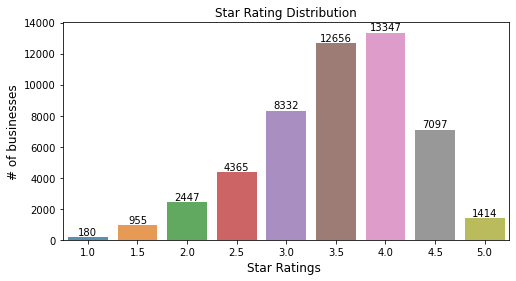

In [47]:
#Get the distribution of the ratings
x=df_rest['stars'].value_counts()
x=x.sort_index()
#plot
plt.figure(figsize=(8,4))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Restaurants Star Rating Distribution")
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Star Ratings ', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

### Which province has most business?

C:\Users\HEN1\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



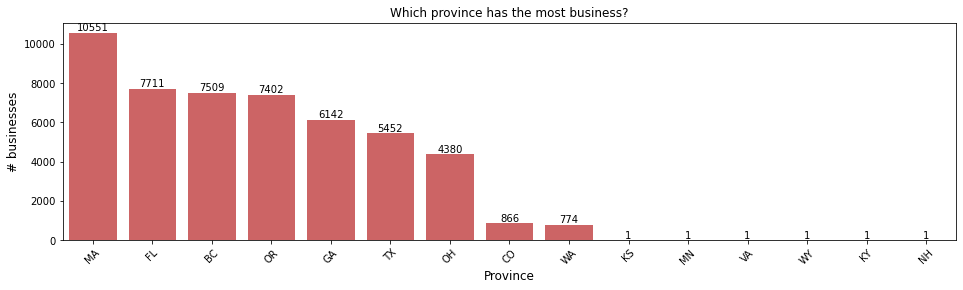

In [7]:
#Get the distribution of the ratings
x=df_rest['state'].value_counts()
x=x.sort_values(ascending=False)
x=x.iloc[0:20]
color = sns.color_palette()
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8,color=color[3])
plt.title("Which province has the most business?")
locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('Province', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

### Which city in BC has most business?

In [28]:
df_rest_bc = df_rest[df_rest['state']=='BC']
city_d = {"BURNABY": 'Burnaby', "N Vancouver": 'North Vancouver', "NEW WESTMINSTER": 'New Westminster',
          "New Westminister": 'New Westminster', "Newwestminster": 'New Westminster', "Port coquitlam": 'Port Coquitlam', 
          'RICHMOND': 'Richmond', 'RichMond': 'Richmond','SURREY': 'Surrey'}
for key in list(city_d.keys()):
    df_rest_bc.loc[df_rest_bc.city==key, 'city']=city_d[key]
    
df_rest_bc = df_rest_bc.loc[:,df_rest_bc.apply(pd.Series.nunique) > 1]
    

C:\Users\HEN1\miniconda3\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\HEN1\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



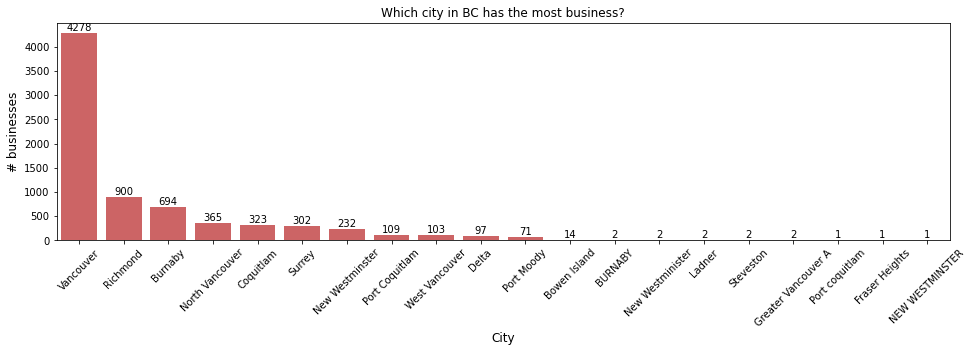

In [50]:
#Get the distribution of the ratings

x=df_rest_bc['city'].value_counts()
x=x.sort_values(ascending=False)
x=x.iloc[0:20]
color = sns.color_palette()
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8,color=color[3])
plt.title("Which city in BC has the most business?")
locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('City', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

### Top 10 restaurants with most reviews in BC

In [57]:
df_rest_bc[df_rest_bc['stars']==5]

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,Weight Loss Centers,Whiskey Bars,Wholesale Stores,Wholesalers,Wine Bars,Wine Tasting Room,Wineries,Women's Clothing,Wraps,Yelp Events
618,VCvleFOouiLzp396Kbwh3Q,Vancouver Foodie Tours,1592 Johnston Street,Vancouver,BC,V6B 2Z4,49.271604,-123.134757,5.0,84,...,0,0,0,0,0,0,0,0,0,0
698,5LuSHON45FNQ1xVyaaUK3A,Bubble Lishus Tea House,2909 E 2nd Avenue,Vancouver,BC,V5M 1E6,49.268662,-123.043902,5.0,9,...,0,0,0,0,0,0,0,0,0,0
1861,ZShmP7n8NdIYzs58FUWKdw,Habibi Donair,835 Denman Street,Vancouver,BC,V6G 2L7,49.291004,-123.136416,5.0,13,...,0,0,0,0,0,0,0,0,0,0
1873,viUq9OyTgOGgcdyuNoey3w,The Garden Strathcona,868 E Hastings Street,Vancouver,BC,V6A 1R6,49.280807,-123.085638,5.0,27,...,0,0,0,0,0,0,0,0,0,0
2221,kMDv_AyIe7oPh2oCfjJWtQ,Tigers Drink House,505 E 15th Avenue,Vancouver,BC,V5T 4S4,49.257337,-123.093744,5.0,5,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49153,M76F3bj0NhenUzfdhuMUig,Gaia Bistro,2055 W 41 Avenue,Vancouver,BC,V6M 1Y7,49.234697,-123.153599,5.0,5,...,0,0,0,0,0,0,0,0,0,0
49414,jI4NgAHKK5nDcv6ieuNU7w,Delicioze,3596 E Hastings Street,Vancouver,BC,V5K 2B1,49.281007,-123.026029,5.0,5,...,0,0,0,0,0,0,0,0,0,0
49577,KICQsCs0Ow7G-9IlFh_qeg,Blue Eyed Marys Restaurant,1735 Marine Drive,West Vancouver,BC,V7V,49.328796,-123.160953,5.0,7,...,0,0,0,0,0,0,0,0,0,0
49895,XFkhu9HNNx6fx1Iz6aRPeA,L'atelier Patisserie,120-260 E 5th Ave,Vancouver,BC,V5T 1H3,49.266180,-123.099300,5.0,75,...,0,0,0,0,0,0,0,0,0,0


In [29]:
df_rest_bc10 = df_rest_bc.sort_values(by='review_count', ascending=False)[:10]

In [30]:
df_rest_bc10

,business_id,name,address,city,postal_code,latitude,longitude,stars,review_count,is_open,...,Ukrainian,Vegan,Vegetarian,Venues & Event Spaces,Vietnamese,Waffles,Wedding Planning,Wine Bars,Wineries,Women's Clothing
1639,VPqWLp9kMiZEbctCebIZUA,Medina Cafe,780 Richards Street,Vancouver,V6B 3A4,49.280443,-123.117036,4.0,2302,1,...,0,0,0,0,0,0,0,0,0,0
21569,4EV_ZcQmjAmP3pmO-_nb2A,Miku,"200 Granville Street, Suite 70",Vancouver,V6C 1S4,49.287008,-123.113051,4.5,1805,1,...,0,0,0,0,0,0,0,0,0,0
30619,_4R46MNkwx9MeOyt0YfNxA,Chambar,568 Beatty Street,Vancouver,V6B 2L3,49.280146,-123.109925,4.0,1356,1,...,0,0,0,0,0,0,0,0,0,0
15871,yeNenSjz_HCqngGFU5d8NQ,Phnom Penh,244 E Georgia Street,Vancouver,V6A 1Z7,49.278431,-123.098205,4.0,1306,1,...,0,0,0,0,1,0,0,0,0,0
16029,LjdbthVdtLYKSi7iVAFl0g,Jam Cafe on Beatty,556 Beatty Street,Vancouver,V6B 2L3,49.280155,-123.109542,4.5,1097,1,...,0,0,0,0,0,0,0,0,0,0
41374,NdEPf2Ls5Ql3_nkwjqKvXA,The Flying Pig - Yaletown,"1168 Hamilton Street, Unit 104",Vancouver,V6B 2S2,49.275107,-123.122096,4.0,1092,1,...,0,0,0,0,0,0,0,0,0,0
7897,2cXOMeyBCx4JFgs5-CJQdQ,Joe Fortes Seafood & Chop House,777 Thurlow Street,Vancouver,V6E 3V5,49.284941,-123.124773,4.0,1037,1,...,0,0,0,0,0,0,0,0,0,0
16683,uAROEz8D29elXoNxjnPrkQ,Twisted Fork,213 Carral Street,Vancouver,V6B 2J2,49.283194,-123.104445,4.0,1032,1,...,0,0,0,0,0,0,0,0,0,0
25579,0iEFOEQIvk7RFcOo_jkOGA,Japadog,899 Burrard Street,Vancouver,V6Z 2K6,49.282350,-123.124337,4.0,987,1,...,0,0,0,0,0,0,0,0,0,0
17144,i0xnuLimVcuSoBqO265obA,Hokkaido Ramen Santouka,1690 Robson Street,Vancouver,V6G 1C7,49.290236,-123.133811,4.0,949,1,...,0,0,0,0,0,0,0,0,0,0


In [35]:
df_filter = (df_rest_bc10 != 0).any()
sub_df = df_rest_bc10.loc[:, df_filter]
sub_df

,business_id,name,address,city,postal_code,latitude,longitude,stars,review_count,is_open,...,American (Traditional),Bars,Breakfast & Brunch,Cafes,Food Stands,Japanese,Ramen,Restaurants,Seafood,Vietnamese
1639,VPqWLp9kMiZEbctCebIZUA,Medina Cafe,780 Richards Street,Vancouver,V6B 3A4,49.280443,-123.117036,4.0,2302,1,...,0,1,0,0,0,0,0,0,0,0
21569,4EV_ZcQmjAmP3pmO-_nb2A,Miku,"200 Granville Street, Suite 70",Vancouver,V6C 1S4,49.287008,-123.113051,4.5,1805,1,...,0,0,0,0,0,1,0,0,0,0
30619,_4R46MNkwx9MeOyt0YfNxA,Chambar,568 Beatty Street,Vancouver,V6B 2L3,49.280146,-123.109925,4.0,1356,1,...,0,0,0,1,0,0,0,0,0,0
15871,yeNenSjz_HCqngGFU5d8NQ,Phnom Penh,244 E Georgia Street,Vancouver,V6A 1Z7,49.278431,-123.098205,4.0,1306,1,...,0,0,0,0,0,0,0,0,0,1
16029,LjdbthVdtLYKSi7iVAFl0g,Jam Cafe on Beatty,556 Beatty Street,Vancouver,V6B 2L3,49.280155,-123.109542,4.5,1097,1,...,0,0,1,0,0,0,0,0,0,0
41374,NdEPf2Ls5Ql3_nkwjqKvXA,The Flying Pig - Yaletown,"1168 Hamilton Street, Unit 104",Vancouver,V6B 2S2,49.275107,-123.122096,4.0,1092,1,...,1,0,0,0,0,0,0,0,0,0
7897,2cXOMeyBCx4JFgs5-CJQdQ,Joe Fortes Seafood & Chop House,777 Thurlow Street,Vancouver,V6E 3V5,49.284941,-123.124773,4.0,1037,1,...,0,0,0,0,0,0,0,0,1,0
16683,uAROEz8D29elXoNxjnPrkQ,Twisted Fork,213 Carral Street,Vancouver,V6B 2J2,49.283194,-123.104445,4.0,1032,1,...,0,0,0,0,0,0,0,1,0,0
25579,0iEFOEQIvk7RFcOo_jkOGA,Japadog,899 Burrard Street,Vancouver,V6Z 2K6,49.282350,-123.124337,4.0,987,1,...,0,0,0,0,1,0,0,0,0,0
17144,i0xnuLimVcuSoBqO265obA,Hokkaido Ramen Santouka,1690 Robson Street,Vancouver,V6G 1C7,49.290236,-123.133811,4.0,949,1,...,0,0,0,0,0,0,1,0,0,0


In [47]:
df_rest_bc10.iloc[:, 20:40]

,RestaurantsPriceRange2,HasTV,Alcohol,DogsAllowed,RestaurantsTakeOut,NoiseLevel,RestaurantsAttire,RestaurantsDelivery,GoodForKids,garage,lot,street,valet,validated,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday
1639,2.0,False,full_bar,False,True,average,casual,True,True,False,True,True,False,False,0:0-0:0,9:0-15:0,9:0-15:0,9:0-22:0,9:0-22:0,9:0-22:0
21569,3.0,True,full_bar,False,True,average,casual,True,True,False,False,True,False,False,11:30-23:0,11:30-23:0,11:30-22:0,11:30-22:30,11:30-23:0,11:30-23:0
30619,3.0,False,full_bar,False,True,average,casual,True,False,True,False,True,True,False,0:0-0:0,NaN,NaN,9:0-22:0,9:0-22:0,9:0-22:0
15871,2.0,True,beer_and_wine,False,True,loud,casual,False,True,True,True,True,False,False,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0,11:0-19:0
16029,2.0,False,full_bar,False,True,average,casual,NaN,True,False,True,True,False,False,8:0-15:0,8:0-15:0,8:0-15:0,8:0-15:0,8:0-15:0,8:0-15:0
41374,2.0,False,full_bar,False,True,average,casual,False,True,False,False,True,False,False,0:0-0:0,15:0-22:0,12:0-22:0,12:0-22:0,12:0-23:0,11:0-23:0
7897,3.0,True,full_bar,False,True,loud,casual,False,False,False,False,True,True,False,11:0-23:0,11:0-23:0,11:0-23:0,11:0-23:0,11:0-23:0,11:0-23:0
16683,2.0,False,full_bar,NaN,False,average,casual,False,False,False,False,True,False,False,0:0-0:0,8:0-15:0,8:0-15:0,8:0-15:0,8:0-15:0,8:0-15:0
25579,1.0,False,no,True,True,average,casual,True,True,False,False,True,False,False,11:0-18:0,11:0-22:0,11:0-22:0,11:0-22:0,11:0-23:0,11:0-23:0
17144,2.0,True,beer_and_wine,False,True,average,casual,True,True,False,False,True,False,False,11:0-23:0,11:0-23:0,11:0-23:0,11:0-23:0,11:0-23:0,11:0-23:0


In [38]:
df_rest_bc10.loc[21569, (df_rest_bc10 !=0).all()]

business_id                           4EV_ZcQmjAmP3pmO-_nb2A
name                                                    Miku
address                       200 Granville Street, Suite 70
city                                               Vancouver
postal_code                                          V6C 1S4
latitude                                           49.287008
longitude                                        -123.113051
stars                                                    4.5
review_count                                            1805
is_open                                                    1
RestaurantsTableService                                 True
WiFi                                                    free
BikeParking                                             True
BusinessAcceptsCreditCards                               NaN
RestaurantsReservations                                 True
WheelchairAccessible                                    True
Caters                  

In [83]:
df_rest_bc.groupby('city')['stars'].mean()

city
Bowen Island           4.035714
Burnaby                3.352730
Coquitlam              3.393189
Delta                  3.427835
Downtown Vancouver     4.000000
Fraser Heights         4.500000
Greater Vancouver A    2.750000
Ladner                 2.250000
Lions Bay              4.000000
New Westminster        3.447034
North Vancouver        3.480874
PORT COQUITLAM         1.500000
Port Coquitlam         3.595455
Port Moody             3.422535
Richmond               3.253326
Steveston              4.000000
Surrey                 3.386139
Vancouver              3.510986
West Vancouver         3.524272
Name: stars, dtype: float64

In [84]:
df_rest_bc.groupby('city')['review_count'].mean()

city
Bowen Island           22.142857
Burnaby                39.533046
Coquitlam              31.458204
Delta                  24.556701
Downtown Vancouver     31.000000
Fraser Heights          6.000000
Greater Vancouver A    12.500000
Ladner                 15.500000
Lions Bay              20.000000
New Westminster        39.500000
North Vancouver        34.846995
PORT COQUITLAM         24.000000
Port Coquitlam         23.090909
Port Moody             35.563380
Richmond               42.832594
Steveston              51.000000
Surrey                 23.227723
Vancouver              69.215288
West Vancouver         32.271845
Name: review_count, dtype: float64

In [89]:
df_rest_bc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7509 entries, 2 to 50769
Columns: 662 entries, business_id to Women's Clothing
dtypes: category(601), float64(4), int64(2), object(55)
memory usage: 7.9+ MB


In [53]:
tf_col2 = ['RestaurantsTableService', 'BikeParking', 'BusinessAcceptsCreditCards', 'RestaurantsReservations', 
           'WheelchairAccessible', 'Caters', 'OutdoorSeating', 'RestaurantsGoodForGroups', 'HappyHour', 'HasTV', 'DogsAllowed', 
          'RestaurantsTakeOut','RestaurantsDelivery', 'GoodForKids', 'lot', 'street', 'valet', 'validated',
          'casual', 'classy', 'hipster', 'intimate', 'romantic', 'touristy', 'trendy', 'upscale', 'breakfast', 
          'brunch', 'dessert', 'dinner', 'latenight', 'lunch', 'background_music', 'dj', 'jukebox', 'karaoke', 'live', 'garage'] 
df_rest_tf = df_rest[tf_col2].apply(pd.Series.value_counts, axis=0, normalize=True).sort_values(by ='True', axis=1, ascending=False)
df_rest_tf.iloc[1,:20]

BusinessAcceptsCreditCards    0.971944
RestaurantsTakeOut            0.950684
WheelchairAccessible          0.928664
RestaurantsGoodForGroups      0.843507
GoodForKids                   0.835593
BikeParking                   0.780144
HasTV                         0.689894
HappyHour                     0.645890
RestaurantsTableService       0.585283
RestaurantsDelivery           0.559344
Caters                        0.555774
lunch                         0.552579
casual                        0.543016
dinner                        0.499513
OutdoorSeating                0.490307
lot                           0.464421
street                        0.391460
RestaurantsReservations       0.341398
DogsAllowed                   0.257205
live                          0.200246
Name: True, dtype: float64

In [54]:
df_rest_bc_tf = df_rest_bc[tf_col2].apply(pd.Series.value_counts, axis=0, normalize=True).sort_values(by ='True', axis=1, ascending=False)
df_rest_bc_tf.iloc[1,:20]

RestaurantsTakeOut            0.944575
WheelchairAccessible          0.901276
BusinessAcceptsCreditCards    0.879213
GoodForKids                   0.847386
RestaurantsGoodForGroups      0.809192
BikeParking                   0.807361
RestaurantsTableService       0.705681
HappyHour                     0.701215
HasTV                         0.677035
street                        0.553191
RestaurantsReservations       0.521461
casual                        0.494530
lunch                         0.485386
RestaurantsDelivery           0.465199
dinner                        0.440082
Caters                        0.417663
OutdoorSeating                0.379086
lot                           0.255259
live                          0.208333
classy                        0.149584
Name: True, dtype: float64

In [50]:
cat_col2 = list(df_rest_bc.select_dtypes(include=['category']).columns)
df_rest_bc_cat = df_rest_bc[cat_col2].apply(pd.Series.value_counts, axis=0, normalize=True).sort_values(by =1, axis=1, ascending=False)
df_rest_bc_cat.iloc[:,:20]

,Restaurants,Restaurants,Food,Chinese,Coffee & Tea,Japanese,Nightlife,Bars,Cafes,Sandwiches,Breakfast & Brunch,Sushi Bars,Canadian (New),Food,Fast Food,Pizza,Burgers,Chinese,Seafood,Specialty Food
0,0.303636,0.696631,0.750832,0.909842,0.913837,0.915834,0.916633,0.91983,0.929285,0.931416,0.931416,0.938873,0.940871,0.942336,0.943534,0.950459,0.954188,0.954588,0.957251,0.95805
1,0.696364,0.303369,0.249168,0.090158,0.086163,0.084166,0.083367,0.08017,0.070715,0.068584,0.068584,0.061127,0.059129,0.057664,0.056466,0.049541,0.045812,0.045412,0.042749,0.04195


In [105]:
cat_col2

[' Acai Bowls',
 ' Accessories',
 ' Accountants',
 ' Active Life',
 ' Acupuncture',
 ' Adult',
 ' Adult Education',
 ' Adult Entertainment',
 ' Advertising',
 ' Afghan',
 ' African',
 ' Air Duct Cleaning',
 ' Airport Lounges',
 ' Airport Shuttles',
 ' Airports',
 ' Amateur Sports Teams',
 ' American (New)',
 ' American (Traditional)',
 ' Amusement Parks',
 ' Anesthesiologists',
 ' Animal Shelters',
 ' Antiques',
 ' Apartments',
 ' Appliances',
 ' Appliances & Repair',
 ' Appraisal Services',
 ' Aquariums',
 ' Arabian',
 ' Arcades',
 ' Argentine',
 ' Armenian',
 ' Art Classes',
 ' Art Galleries',
 ' Art Museums',
 ' Art Schools',
 ' Art Supplies',
 ' Art Tours',
 ' Arts & Crafts',
 ' Arts & Entertainment',
 ' Asian Fusion',
 ' Australian',
 ' Austrian',
 ' Auto Detailing',
 ' Auto Parts & Supplies',
 ' Auto Repair',
 ' Automotive',
 ' Axe Throwing',
 ' Baby Gear & Furniture',
 ' Badminton',
 ' Bagels',
 ' Bakeries',
 ' Bangladeshi',
 ' Banks & Credit Unions',
 ' Bar Crawl',
 ' Barbeque'

In [90]:
for col in df_rest_bc:
    print({col:df_rest_bc[col].unique()})

{'business_id': array(['D4JtQNTI4X3KcbzacDJsMw', 'QciD6FbNklaJvUbLExD4Nw',
       'Xi2GGNzOiUS8r6WCFvu-fw', ..., 'qYn6CQIhtPadf7dqyxnCbg',
       'ZE2KU6QYcicqn0oO8YhZUQ', 'dplKdpONowTjlPZvq0wSRw'], dtype=object)}
{'name': array(['Bob Likes Thai Food', 'ARGO', 'Kerala Kitchen', ...,
       'Megabite Davie', 'Delhi Belly', 'Baccano Osteria-Bar'],
      dtype=object)}
{'address': array(['3755 Main St', '3790 Canada Way, Unit 108',
       '103- 9386 120 Street', ..., '205 - 1425 Marine Drive',
       '4151 Hazelbridge Way, Unit 3250', '7898 6th Street'], dtype=object)}
{'city': array(['Vancouver', 'Burnaby', 'Surrey', 'Coquitlam', 'Richmond',
       'North Vancouver', 'Delta', 'New Westminster', 'Port Coquitlam',
       'West Vancouver', 'Port Moody', 'Greater Vancouver A', 'Steveston',
       'Bowen Island', 'Lions Bay', 'Ladner', 'PORT COQUITLAM',
       'Fraser Heights', 'Downtown Vancouver'], dtype=object)}
{'postal_code': array(['V5V', 'V5G 1G4', 'V3V 4B9', ..., 'V5T 1V6', 'V6K 1R3',

{' Music Venues': [0, 1]
Categories (2, int64): [0, 1]}
{' Nightlife': [0, 1]
Categories (2, int64): [0, 1]}
{' Noodles': [0, 1]
Categories (2, int64): [0, 1]}
{' Nutritionists': [0, 1]
Categories (2, int64): [0, 1]}
{' Organic Stores': [0, 1]
Categories (2, int64): [0, 1]}
{' Oriental': [0, 1]
Categories (2, int64): [0, 1]}
{' Outdoor Gear': [0, 1]
Categories (2, int64): [0, 1]}
{' Outlet Stores': [0, 1]
Categories (2, int64): [0, 1]}
{' Painters': [0, 1]
Categories (2, int64): [0, 1]}
{' Pakistani': [0, 1]
Categories (2, int64): [0, 1]}
{' Pan Asian': [0, 1]
Categories (2, int64): [0, 1]}
{' Pancakes': [0, 1]
Categories (2, int64): [0, 1]}
{' Parks': [0, 1]
Categories (2, int64): [0, 1]}
{' Party & Event Planning': [0, 1]
Categories (2, int64): [0, 1]}
{' Party Equipment Rentals': [0, 1]
Categories (2, int64): [0, 1]}
{' Pasta Shops': [0, 1]
Categories (2, int64): [0, 1]}
{' Patisserie/Cake Shop': [0, 1]
Categories (2, int64): [0, 1]}
{' Performing Arts': [0, 1]
Categories (2, int64)

C:\Users\HEN1\miniconda3\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,Weight Loss Centers,Whiskey Bars,Wholesale Stores,Wholesalers,Wine Bars,Wine Tasting Room,Wineries,Women's Clothing,Wraps,Yelp Events
2,D4JtQNTI4X3KcbzacDJsMw,Bob Likes Thai Food,3755 Main St,Vancouver,BC,V5V,49.251342,-123.101333,3.5,169,...,0,0,0,0,0,0,0,0,0,0
11,QciD6FbNklaJvUbLExD4Nw,ARGO,"3790 Canada Way, Unit 108",Burnaby,BC,V5G 1G4,49.254436,-123.020050,4.0,76,...,0,0,0,0,0,0,0,0,0,0
17,Xi2GGNzOiUS8r6WCFvu-fw,Kerala Kitchen,103- 9386 120 Street,Surrey,BC,V3V 4B9,49.173723,-122.889641,4.0,9,...,0,0,0,0,0,0,0,0,0,0
40,NoPXKdIwRzflOW-5exFAqA,1st Avenue Seafood by Pocha,901 Lougheed Hwy,Coquitlam,BC,V3K 3T3,49.237547,-122.872628,4.0,12,...,0,0,0,0,0,0,0,0,0,0
46,jfDfHzAq6iKkRnzzZ4n1nQ,Let's Roll Custom Sushi Bar,"1184 Denman Street, Suite 104",Vancouver,BC,V6G 2M9,49.286360,-123.140261,4.5,31,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50740,aCnAeNWkJdu0b2ckwnn8Fw,Delhi Belly,205 - 1425 Marine Drive,West Vancouver,BC,V7T 1B8,49.328263,-123.155029,3.5,11,...,0,0,0,0,0,0,0,0,0,0
50744,6SxKXdMTcQ9xLKg7X3A5yg,Teppan Kitchen,"4151 Hazelbridge Way, Unit 3250",Richmond,BC,V6X 4J7,49.184112,-123.133543,3.5,32,...,0,0,0,0,0,0,0,0,0,0
50748,qYn6CQIhtPadf7dqyxnCbg,Pizza Factory,7898 6th Street,Burnaby,BC,V3N 3N3,49.219277,-122.927318,2.0,5,...,0,0,0,0,0,0,0,0,0,0
50750,ZE2KU6QYcicqn0oO8YhZUQ,Baccano Osteria-Bar,1889 W 1st Avenue,Vancouver,BC,V6J 5B8,49.270823,-123.147734,2.0,5,...,0,0,0,0,0,0,0,0,0,0
